# Generators (uniform/non-uniform)

## Notebook for generating different Pareto-optimal data points for visualization

This notebook can be used to generate different Pareto-optimal data points for visualiation. The points generated in this notebook are randomly sampled (either uniform or non-uniform). Currently this notebook implements following Pareto-optimal front (i.e. surface or point-clouds) through the `generators` module.

- DTLZ2 ($m$-Sphere) Problem -- uniformly distributed
- DEBMDK (Knee) Problem -- uniformly distributed
- CDEBMDK (Constrained Knee) Problem -- uniformly distributed
- C0-DTLZ2 (A split $m$-sphere with a small isolated cluster at $f_m$-axis) -- non-uniformly distributed
- C2-DTLZ2 Problem -- uniformly distributed
- DTLZ8 Problem (A 3-dimensional line and an $m$-dimensional hypersurface) -- uniformly distributed 

In [1]:
%matplotlib notebook
%reload_ext autoreload
%autoreload 2

import sys
import os

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.mplot3d import Axes3D

sys.path.append('../')
from vis.utils import transform as tr

plt.rcParams.update({'figure.max_open_warning': 0})

### Generate Pareto-optimal front for DTLZ2 (uniformly random distributed)

../data/dtlz2/2d dataf.csv datax.csv dtlz2
F.shape: (500, 2)
X.shape: (500, 1)
F.shape: (500, 2)
X.shape: (500, 1)
[[0.64930888 0.7605248 ]
 [0.49111904 0.87109247]
 [0.56504    0.82506351]]
[[0.4498835 ]
 [0.32682399]
 [0.38227854]]


<IPython.core.display.Javascript object>


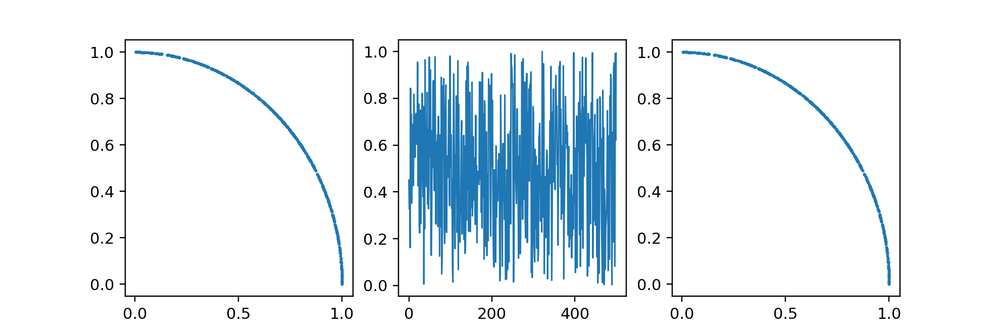

../data/dtlz2/3d dataf.csv datax.csv dtlz2
F.shape: (1000, 3)
X.shape: (1000, 2)
F.shape: (1000, 3)
X.shape: (1000, 2)
[[0.5661919  0.80335031 0.18454   ]
 [0.21931041 0.24052583 0.94554231]
 [0.69290284 0.14874661 0.70552116]]
[[0.88184095 0.39084148]
 [0.21106469 0.47064916]
 [0.50142597 0.86537891]]


<IPython.core.display.Javascript object>


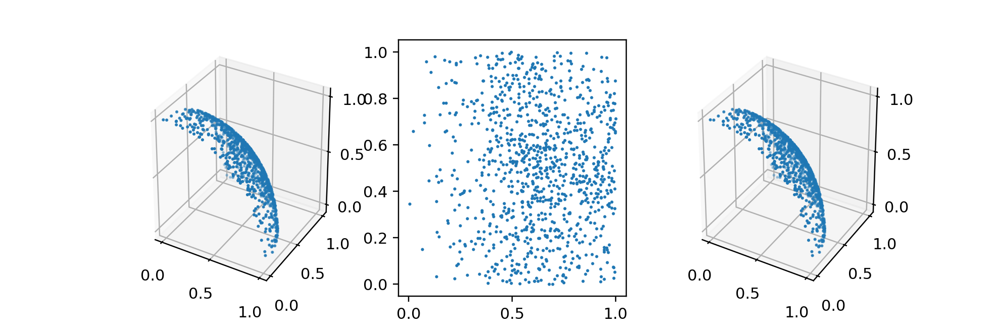

../data/dtlz2/4d dataf.csv datax.csv dtlz2
F.shape: (2000, 4)
X.shape: (2000, 3)
F.shape: (2000, 4)
X.shape: (2000, 3)
[[0.48825313 0.44315711 0.45675484 0.59715632]
 [0.6112479  0.49321131 0.47217955 0.4002063 ]
 [0.67634957 0.69087166 0.20070434 0.15800435]]
[[0.59259439 0.61432708 0.53079912]
 [0.73787693 0.65540501 0.56778003]
 [0.898988   0.86969424 0.49323832]]


<IPython.core.display.Javascript object>


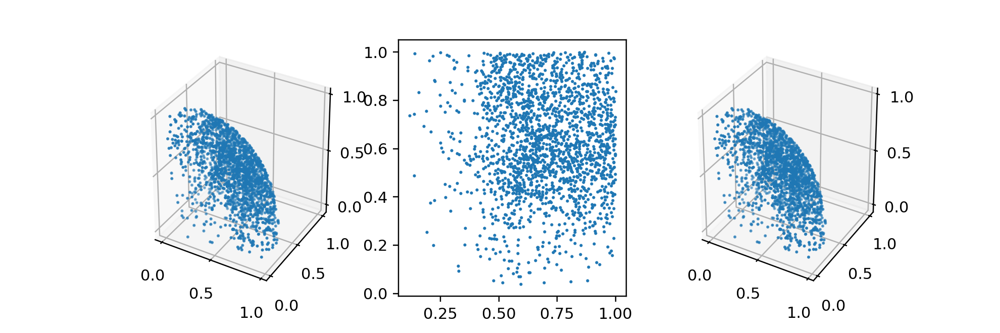

../data/dtlz2/8d dataf.csv datax.csv dtlz2
F.shape: (4000, 8)
X.shape: (4000, 7)
F.shape: (4000, 8)
X.shape: (4000, 7)
[[0.26984233 0.31427116 0.53296893 0.2089546  0.45746623 0.16678628
  0.25630114 0.44487927]
 [0.65440162 0.34107595 0.23506173 0.14392554 0.29557906 0.32349315
  0.37505235 0.21628241]
 [0.11559517 0.22215783 0.58550456 0.34396923 0.57717929 0.03513414
  0.19706759 0.32085395]]
[[0.70649317 0.81522817 0.87547435 0.63422915 0.80888508 0.42060406
  0.45167049]
 [0.86121362 0.74899273 0.7663238  0.77147585 0.88302893 0.80368496
  0.6941261 ]
 [0.79206026 0.86656464 0.97585011 0.57143399 0.68471893 0.25730433
  0.30543634]]


<IPython.core.display.Javascript object>


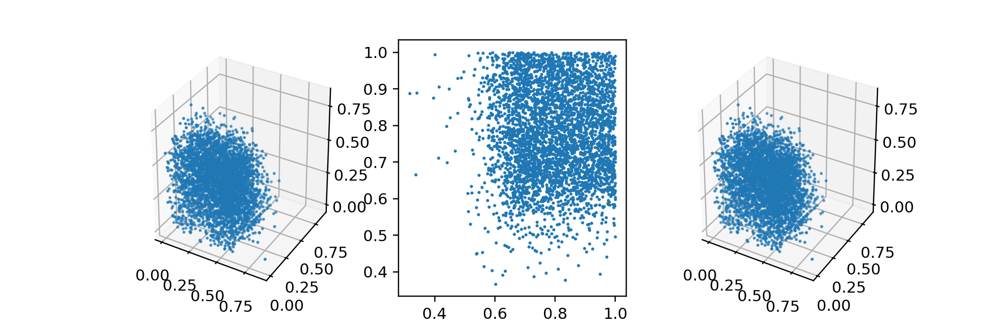

In [2]:
from vis.generators import dtlz2

dims = {"2d": 500, "3d": 1000, "4d": 2000, "8d": 4000}

for dim in dims:
    # Open all files
    fullpathf = "../data/dtlz2/{0:s}/dataf.csv".format(dim)
    path, filenamef = os.path.split(fullpathf)
    dirs = path.split('/')
    frontname = dirs[-2]
    os.makedirs(path, exist_ok = True)
    filenamex = filenamef.split('.')[0][0:-1] + 'x.csv'
    fullpathx = os.path.join(path, filenamex)
    print(path, filenamef, filenamex, frontname)

    np.random.seed(123456)
    r, n, m = 1, dims[dim], int(dim[0])
    F, X = dtlz2.surface(r = r, n = n, m = m, mode = 'lhcl2') # uniform
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    
    Ip = tr.pfindices(F)
    F = F[Ip]
    X = X[Ip]
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)

    print(F[0:3,:])
    print(X[0:3,:])
    
    # Just to make sure if we can get correct F from X
    F_ = np.zeros(F.shape)
    for i in range(m):
        if i < m-1:
            F_[:,i] = np.prod(np.sin(X[:,0:i] * (np.pi / 2)), axis = 1) \
                    * np.cos(X[:,i] * (np.pi / 2))
        else:
            F_[:,i] = np.prod(np.sin(X[:,0:i-1] * (np.pi / 2)), axis = 1) \
                    * np.sin(X[:,i-1] * (np.pi / 2))
    F_ = F_[:,::-1]
    F_ = r * F_

    # Plot
    if dim == "2d":
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1)
        ax1.scatter(F[:,0], F[:,1], s = 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.plot(X[:,0], lw = 1.0)
        ax3 = fig.add_subplot(1, 3, 3)
        ax3.scatter(F_[:,0], F_[:,1], s = 1)
        plt.show()
    else:
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1, projection = '3d')
        ax1.scatter(F[:,0], F[:,1], F[:,2], s = 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.scatter(X[:,0], X[:,1], s = 1)
        ax3 = fig.add_subplot(1, 3, 3, projection = '3d')
        ax3.scatter(F_[:,0], F_[:,1], F_[:,2], s = 1)
        plt.show()

    np.savetxt(fullpathf, F, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathx, X, delimiter = ',', fmt = "%1.4e")

### Generate Pareto-optimal front for DEBMDK (uniformly random distributed)

../data/debmdk/2d dataf.csv datax.csv debmdk
F.shape: (1000, 2)
X.shape: (1000, 1)
F.shape: (510, 2)
X.shape: (510, 1)
[[7.31682975 1.6807708 ]
 [1.78790826 7.02852967]
 [1.58852986 7.53456781]]
[[0.85625394]
 [0.15857914]
 [0.13228268]]


<IPython.core.display.Javascript object>


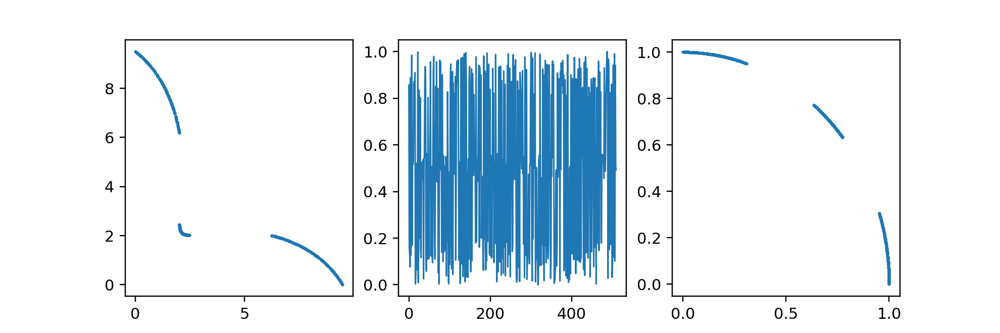

../data/debmdk/3d dataf.csv datax.csv debmdk
F.shape: (1500, 3)
X.shape: (1500, 2)
F.shape: (1047, 3)
X.shape: (1047, 2)
[[1.47609917 1.83359934 2.09206135]
 [4.60500773 3.85622368 0.49381684]
 [3.77254807 3.12101835 1.36822654]]
[[0.53745271 0.4315005 ]
 [0.94777748 0.55619184]
 [0.82652433 0.55999047]]


<IPython.core.display.Javascript object>


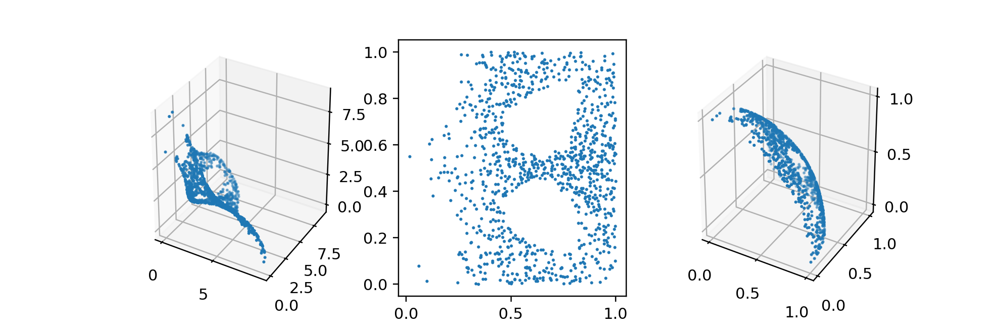

../data/debmdk/4d dataf.csv datax.csv debmdk
F.shape: (2500, 4)
X.shape: (2500, 3)
F.shape: (1967, 4)
X.shape: (1967, 3)
[[2.15267894 3.53647278 0.43220864 3.34433536]
 [3.49605801 3.971384   2.29013817 0.51770141]
 [1.58454348 1.30135103 1.49725949 2.08207107]]
[[0.56912149 0.93377996 0.34810228]
 [0.94298725 0.73994598 0.45953176]
 [0.56273394 0.59847255 0.56227204]]


<IPython.core.display.Javascript object>


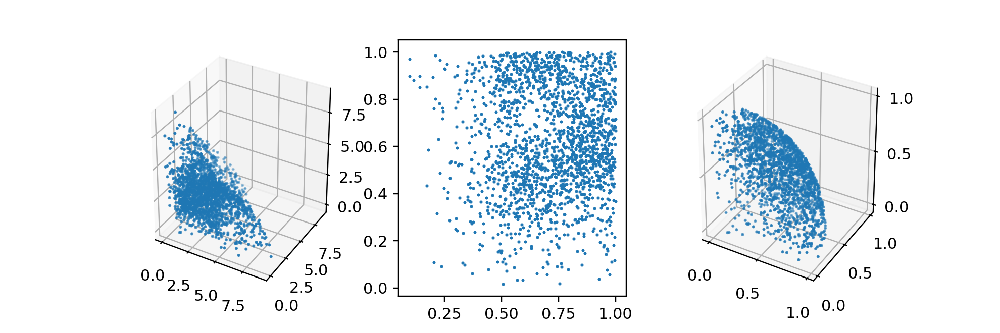

../data/debmdk/8d dataf.csv datax.csv debmdk
F.shape: (4100, 8)
X.shape: (4100, 7)
F.shape: (4077, 8)
X.shape: (4077, 7)
[[1.4537786  2.65838741 0.0718297  1.82230737 1.69214164 2.67260547
  2.53343287 1.27543405]
 [0.88524986 1.01661103 1.95523542 1.87266265 2.53653754 1.50030981
  0.85231406 1.76276588]
 [2.43680751 1.42023599 2.22198795 0.19156574 2.75949975 2.2874129
  0.640492   2.1576011 ]]
[[0.85177925 0.68778049 0.61908101 0.71588359 0.65536603 0.98491068
  0.31858554]
 [0.75273472 0.87321007 0.7687649  0.55570786 0.57492579 0.38426708
  0.45609852]
 [0.74597947 0.92010919 0.70246117 0.58328595 0.96606712 0.57520862
  0.66405816]]


<IPython.core.display.Javascript object>


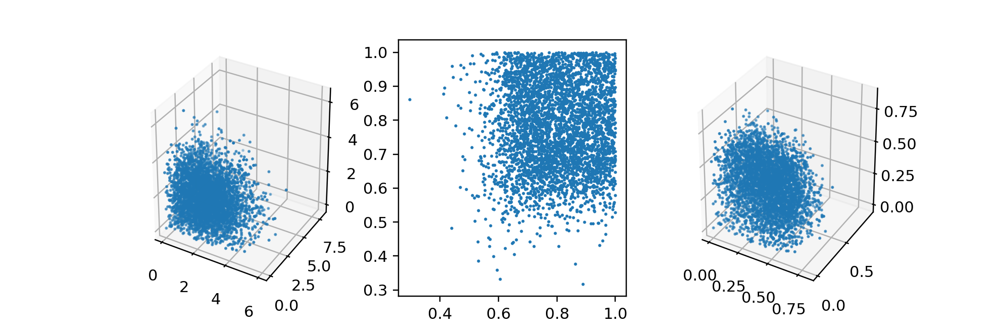

In [3]:
from vis.generators import debmdk

dims = {"2d": 1000, "3d": 1500, "4d": 2500, "8d": 4100}

for dim in dims:
    # Open all files
    fullpathf = "../data/debmdk/{0:s}/dataf.csv".format(dim)
    path, filenamef = os.path.split(fullpathf)
    dirs = path.split('/')
    frontname = dirs[-2]
    os.makedirs(path, exist_ok = True)
    filenamex = filenamef.split('.')[0][0:-1] + 'x.csv'
    fullpathx = os.path.join(path, filenamex)
    print(path, filenamef, filenamex, frontname)

    np.random.seed(123456)
    r, n, m = 1, dims[dim], int(dim[0])
    F, X = debmdk.surface(r = r, n = n, m = m, mode = 'lhcl2') # uniform
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    
    Ip = tr.pfindices(F)
    F = F[Ip]
    X = X[Ip]
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)

    print(F[0:3,:])
    print(X[0:3,:])
    
    # Just to make sure if we can get correct F from X
    F_ = np.zeros(F.shape)
    for i in range(m):
        if i < m-1:
            F_[:,i] = np.prod(np.sin(X[:,0:i] * (np.pi / 2)), axis = 1) \
                    * np.cos(X[:,i] * (np.pi / 2))
        else:
            F_[:,i] = np.prod(np.sin(X[:,0:i-1] * (np.pi / 2)), axis = 1) \
                    * np.sin(X[:,i-1] * (np.pi / 2))
    F_ = F_[:,::-1]
    F_ = r * F_

    # Plot
    if dim == "2d":
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1)
        ax1.scatter(F[:,0], F[:,1], s = 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.plot(X[:,0], lw = 1.0)
        ax3 = fig.add_subplot(1, 3, 3)
        ax3.scatter(F_[:,0], F_[:,1], s = 1)
        plt.show()
    else:
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1, projection = '3d')
        ax1.scatter(F[:,0], F[:,1], F[:,2], s = 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.scatter(X[:,0], X[:,1], s = 1)
        ax3 = fig.add_subplot(1, 3, 3, projection = '3d')
        ax3.scatter(F_[:,0], F_[:,1], F_[:,2], s = 1)
        plt.show()

    np.savetxt(fullpathf, F, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathx, X, delimiter = ',', fmt = "%1.4e")

### Generate all points for DEBMDK (uniformly random distributed)

../data/debmdk-all/2d dataf.csv datax.csv debmdk-all
F.shape: (500, 2)
X.shape: (500, 1)
[[2.02808806 2.37546617]
 [2.1469542  3.80802916]
 [2.06872195 3.02071892]]
[[0.4498835 ]
 [0.32682399]
 [0.38227854]]


<IPython.core.display.Javascript object>


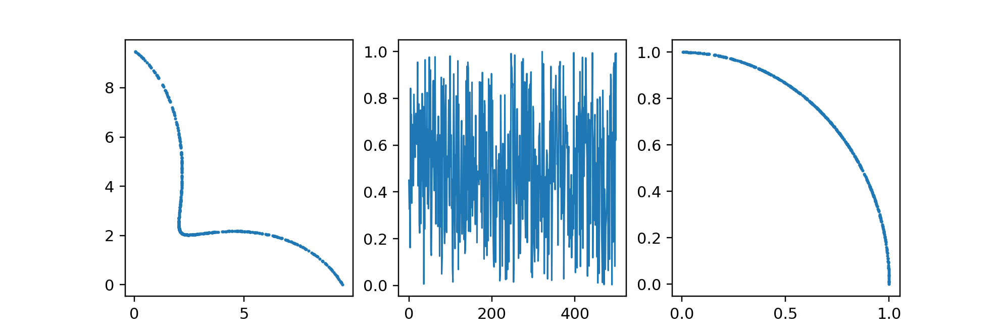

../data/debmdk-all/3d dataf.csv datax.csv debmdk-all
F.shape: (1000, 3)
X.shape: (1000, 2)
[[3.25648426 4.62051403 1.06139207]
 [1.02656726 1.12587421 4.42597672]
 [3.69362588 0.79291684 3.76088978]]
[[0.88184095 0.39084148]
 [0.21106469 0.47064916]
 [0.50142597 0.86537891]]


<IPython.core.display.Javascript object>


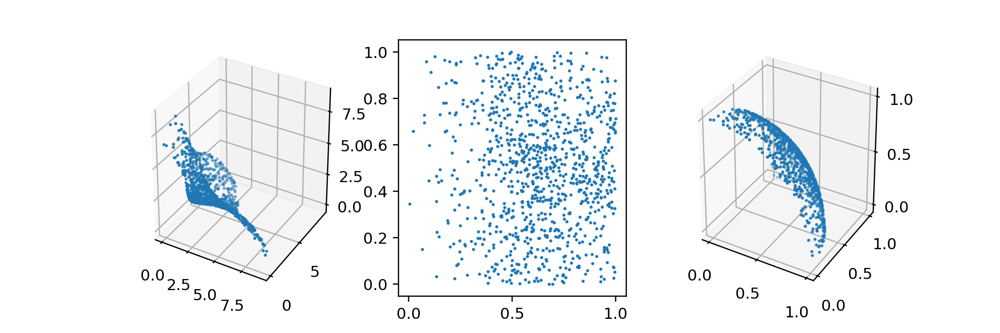

../data/debmdk-all/4d dataf.csv datax.csv debmdk-all
F.shape: (2000, 4)
X.shape: (2000, 3)
[[1.64158801 1.48996772 1.53568556 2.00773863]
 [2.5997999  2.09775887 2.0083052  1.70218385]
 [4.26950884 4.3611807  1.26696165 0.99741463]]
[[0.59259439 0.61432708 0.53079912]
 [0.73787693 0.65540501 0.56778003]
 [0.898988   0.86969424 0.49323832]]


<IPython.core.display.Javascript object>


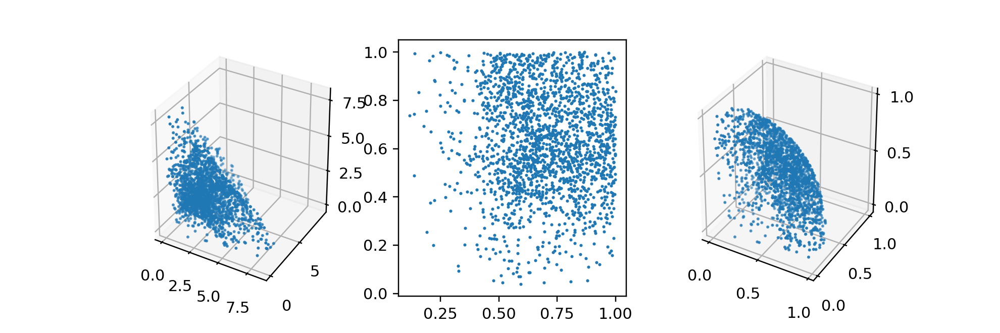

../data/debmdk-all/8d dataf.csv datax.csv debmdk-all
F.shape: (4000, 8)
X.shape: (4000, 7)
[[1.40528287 1.63665904 2.77559164 1.08819224 2.38238922 0.86858834
  1.33476318 2.31683896]
 [4.14542606 2.1606076  1.48904129 0.91172253 1.8723993  2.04922619
  2.37583732 1.37008023]
 [0.68174288 1.31021488 3.45311611 2.02861901 3.40401642 0.20720979
  1.16224079 1.89229263]]
[[0.70649317 0.81522817 0.87547435 0.63422915 0.80888508 0.42060406
  0.45167049]
 [0.86121362 0.74899273 0.7663238  0.77147585 0.88302893 0.80368496
  0.6941261 ]
 [0.79206026 0.86656464 0.97585011 0.57143399 0.68471893 0.25730433
  0.30543634]]


<IPython.core.display.Javascript object>


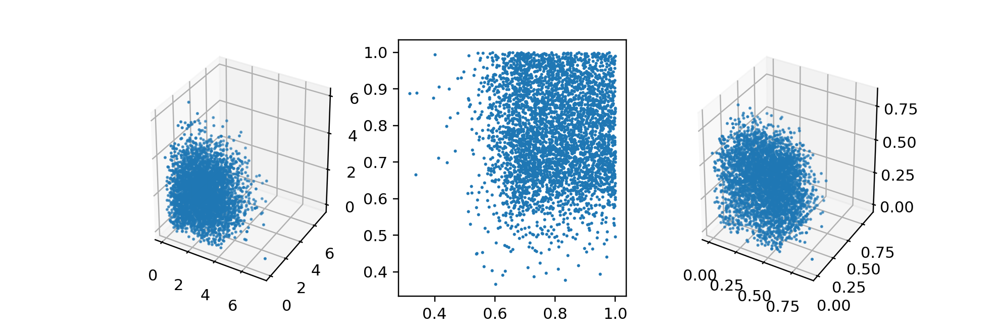

In [4]:
from vis.generators import debmdk

dims = {"2d": 500, "3d": 1000, "4d": 2000, "8d": 4000}

for dim in dims:
    # Open all files
    fullpathf = "../data/debmdk-all/{0:s}/dataf.csv".format(dim)
    path, filenamef = os.path.split(fullpathf)
    dirs = path.split('/')
    frontname = dirs[-2]
    os.makedirs(path, exist_ok = True)
    filenamex = filenamef.split('.')[0][0:-1] + 'x.csv'
    fullpathx = os.path.join(path, filenamex)
    print(path, filenamef, filenamex, frontname)

    np.random.seed(123456)
    r, n, m = 1, dims[dim], int(dim[0])
    F, X = debmdk.surface(r = r, n = n, m = m, mode = 'lhcl2') # uniform
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    
#     Ip = tr.pfindices(F)
#     F = F[Ip]
#     X = X[Ip]
#     print("F.shape:", F.shape)
#     print("X.shape:", X.shape)

    print(F[0:3,:])
    print(X[0:3,:])
    
    # Just to make sure if we can get correct F from X
    F_ = np.zeros(F.shape)
    for i in range(m):
        if i < m-1:
            F_[:,i] = np.prod(np.sin(X[:,0:i] * (np.pi / 2)), axis = 1) \
                    * np.cos(X[:,i] * (np.pi / 2))
        else:
            F_[:,i] = np.prod(np.sin(X[:,0:i-1] * (np.pi / 2)), axis = 1) \
                    * np.sin(X[:,i-1] * (np.pi / 2))
    F_ = F_[:,::-1]
    F_ = r * F_

    # Plot
    if dim == "2d":
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1)
        ax1.scatter(F[:,0], F[:,1], s = 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.plot(X[:,0], lw = 1.0)
        ax3 = fig.add_subplot(1, 3, 3)
        ax3.scatter(F_[:,0], F_[:,1], s = 1)
        plt.show()
    else:
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1, projection = '3d')
        ax1.scatter(F[:,0], F[:,1], F[:,2], s = 1)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.scatter(X[:,0], X[:,1], s = 1)
        ax3 = fig.add_subplot(1, 3, 3, projection = '3d')
        ax3.scatter(F_[:,0], F_[:,1], F_[:,2], s = 1)
        plt.show()

    np.savetxt(fullpathf, F, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathx, X, delimiter = ',', fmt = "%1.4e")

### Generate Pareto-optimal front for CDEBMDK (uniformly random distributed)

../data/cdebmdk/2d dataf.csv datax.csv datacv.csv cdebmdk
F.shape: (574, 2)
X.shape: (574, 1)
CV.shape: (574,)
F.shape: (546, 2)
X.shape: (546, 1)
CV.shape: (546,)
[[2.24220166 2.05179277]
 [2.19773787 2.06881024]
 [2.06393633 2.20877184]]
[[0.52821119]
 [0.51923169]
 [0.47842823]]
[0.96307994 0.65397408 0.00161761]


<IPython.core.display.Javascript object>


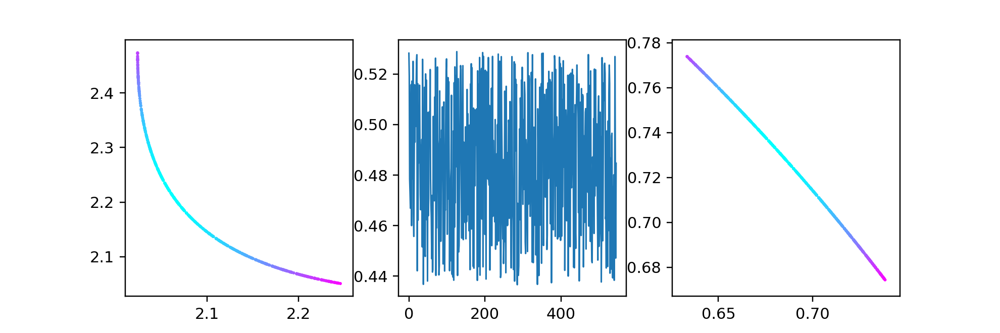

../data/cdebmdk/3d dataf.csv datax.csv datacv.csv cdebmdk
F.shape: (2508, 3)
X.shape: (2508, 2)
CV.shape: (2508,)
F.shape: (1099, 3)
X.shape: (1099, 2)
CV.shape: (1099,)
[[2.35880662 2.19083817 1.81737334]
 [1.53370609 1.46534295 2.12884206]
 [2.51423273 2.41391923 1.76558723]]
[[0.67282259 0.52349271]
 [0.49885511 0.51450919]
 [0.70150101 0.51295673]]
[0.27889233 0.04697522 0.49984458]


<IPython.core.display.Javascript object>


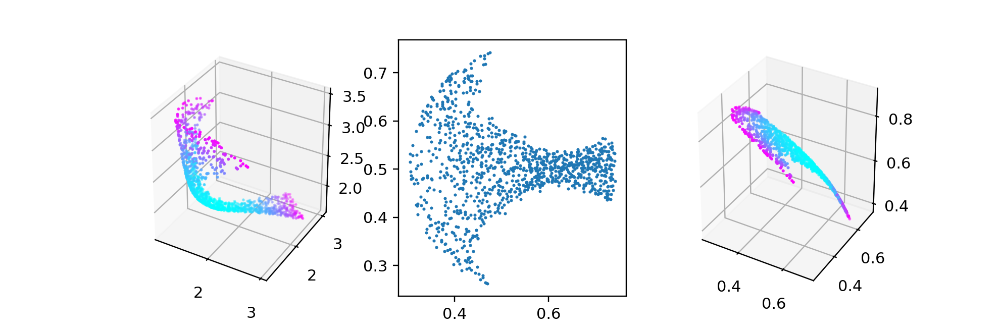

../data/cdebmdk/4d dataf.csv datax.csv datacv.csv cdebmdk
F.shape: (5594, 4)
X.shape: (5594, 3)
CV.shape: (5594,)
F.shape: (1982, 4)
X.shape: (1982, 3)
CV.shape: (1982,)
[[1.5027149  1.67640854 2.00537561 1.72998273]
 [2.62501751 2.69423634 1.77843177 1.78380739]
 [1.01799428 1.11769593 1.56623015 2.09215568]]
[[0.66836529 0.53674367 0.46525238]
 [0.74216063 0.71884295 0.49171621]
 [0.51262704 0.48874475 0.47030187]]
[0.10179126 0.77702012 0.4195088 ]


<IPython.core.display.Javascript object>


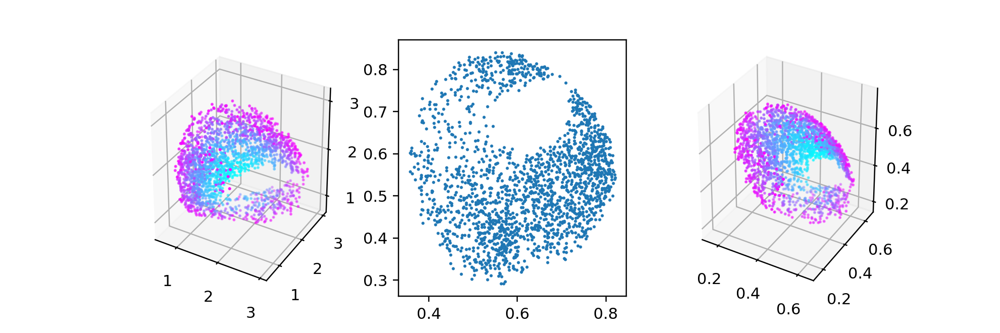

../data/cdebmdk/8d dataf.csv datax.csv datacv.csv cdebmdk
F.shape: (4100, 8)
X.shape: (4100, 7)
CV.shape: (4100,)
F.shape: (3919, 8)
X.shape: (3919, 7)
CV.shape: (3919,)
[[2.20575378 1.49590273 1.85819571 2.07228447 0.81319127 2.06170892
  1.39769147 2.0383298 ]
 [2.33048679 2.3124754  2.05910403 1.38746516 1.22537188 2.42275898
  1.07361886 1.94266495]
 [1.30526813 1.03585636 1.50832302 1.68665345 1.20758044 2.29286565
  0.84381473 2.033664  ]]
[[0.73750059 0.80607171 0.69298784 0.86760257 0.638548   0.6123902
  0.62061758]
 [0.76606468 0.86352041 0.67302183 0.81580295 0.78112918 0.64338586
  0.50246962]
 [0.69497518 0.86168725 0.59047532 0.74161429 0.59016336 0.5316632
  0.57294004]]
[0.43615785 0.65135979 0.68518935]


<IPython.core.display.Javascript object>


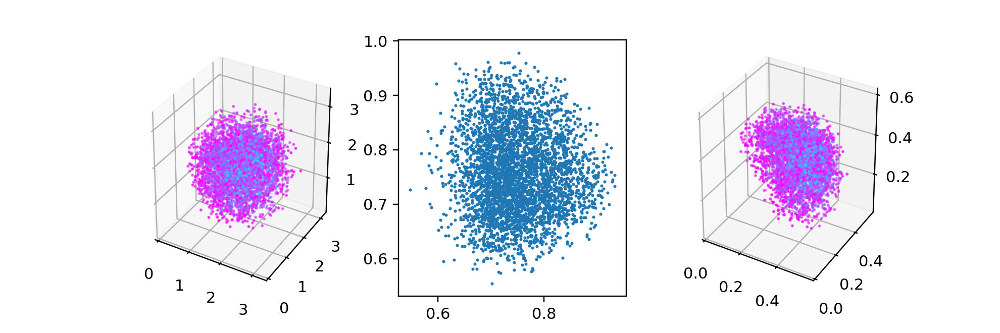

In [5]:
from vis.generators import cdebmdk

dims = {"2d": 4000, "3d": 9000, "4d": 26000, "8d": 51000}

for dim in dims:
    # Open all files
    fullpathf = "../data/cdebmdk/{0:s}/dataf.csv".format(dim)
    path, filenamef = os.path.split(fullpathf)
    dirs = path.split('/')
    frontname = dirs[-2]
    os.makedirs(path, exist_ok = True)
    filenamex = filenamef.split('.')[0][0:-1] + 'x.csv'
    fullpathx = os.path.join(path, filenamex)
    filenamecv = filenamef.split('.')[0][0:-1] + 'cv.csv'
    fullpathcv = os.path.join(path, filenamecv)
    print(path, filenamef, filenamex, filenamecv, frontname)

    np.random.seed(123456)
    r, n, m = 1, dims[dim], int(dim[0])
    F, X, CV = cdebmdk.surface(r = r, n = n, m = m, mode = 'lhcl2') # uniform
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    print("CV.shape:", CV.shape)
    
    Ip = tr.pfindices(F)
    F = F[Ip]
    X = X[Ip]
    CV = CV[Ip]
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    print("CV.shape:", CV.shape)

    print(F[0:3,:])
    print(X[0:3,:])
    print(CV[0:3])
    
    # Just to make sure if we can get correct F from X. Here we 
    # don't apply the exact function as F, just map them on a sphere
    # for the sanity check.
    F_ = np.zeros(F.shape)
    for i in range(m):
        if i < m-1:
            F_[:,i] = np.prod(np.sin(X[:,0:i] * (np.pi / 2)), axis = 1) \
                    * np.cos(X[:,i] * (np.pi / 2))
        else:
            F_[:,i] = np.prod(np.sin(X[:,0:i-1] * (np.pi / 2)), axis = 1) \
                    * np.sin(X[:,i-1] * (np.pi / 2))
    F_ = F_[:,::-1]
    F_ = r * F_
    
    color = [cm.cool(v * 1.0) for v in CV]

    # Plot
    if dim == "2d":
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1)
        ax1.scatter(F[:,0], F[:,1], s = 1, c = color)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.plot(X[:,0], lw = 1.0)
        ax3 = fig.add_subplot(1, 3, 3)
        ax3.scatter(F_[:,0], F_[:,1], s = 1, c = color)
        plt.show()
    else:
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1, projection = '3d')
        ax1.scatter(F[:,0], F[:,1], F[:,2], s = 1, c = color)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.scatter(X[:,0], X[:,1], s = 1)
        ax3 = fig.add_subplot(1, 3, 3, projection = '3d')
        ax3.scatter(F_[:,0], F_[:,1], F_[:,2], s = 1, c = color)
        plt.show()

    np.savetxt(fullpathf, F, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathx, X, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathcv, CV, delimiter = ',', fmt = "%1.4e")

### Generate Pareto-optimal front for C0-DTLZ2 (non-uniformly random distributed)

../data/c0dtlz2/2d dataf.csv datax.csv datacv.csv c0dtlz2
F.shape: (501, 2)
X.shape: (501, 1)
CV.shape: (501,)
F.shape: (501, 2)
X.shape: (501, 1)
CV.shape: (501,)
[[0.14119062 0.98998243]
 [0.92624928 0.37691149]
 [0.99494985 0.10037326]]
[[0.09018609]
 [0.75397218]
 [0.93599261]]
[0.99678862 0.692732   0.21956141]


<IPython.core.display.Javascript object>


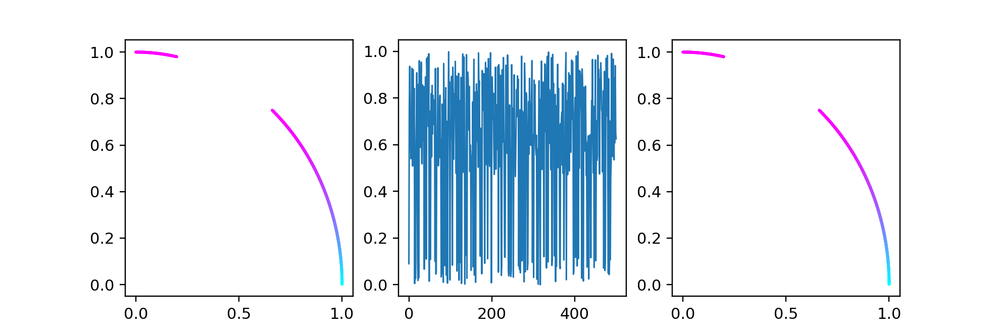

../data/c0dtlz2/3d dataf.csv datax.csv datacv.csv c0dtlz2
F.shape: (1002, 3)
X.shape: (1002, 2)
CV.shape: (1002,)
F.shape: (1002, 3)
X.shape: (1002, 2)
CV.shape: (1002,)
[[0.49197898 0.55123604 0.67386609]
 [0.06349392 0.06981386 0.99553732]
 [0.78623401 0.01343733 0.61778274]]
[[0.52926492 0.46387732]
 [0.06016651 0.46984128]
 [0.57606224 0.98912075]]
[0.9682938  0.99481766 0.934841  ]


<IPython.core.display.Javascript object>


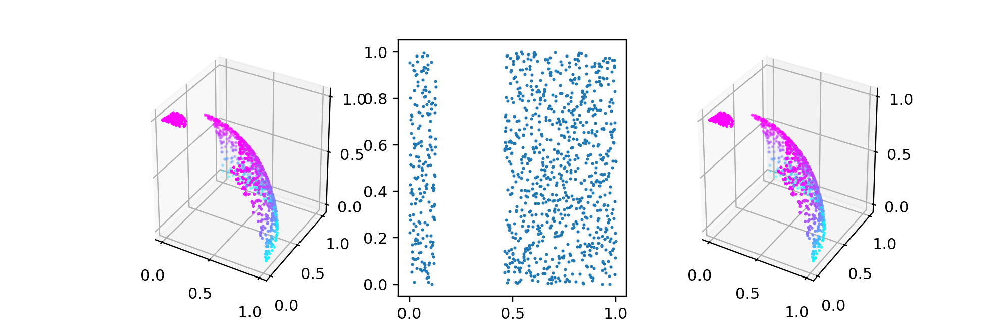

../data/c0dtlz2/4d dataf.csv datax.csv datacv.csv c0dtlz2
F.shape: (2003, 4)
X.shape: (2003, 3)
CV.shape: (2003,)
F.shape: (2003, 4)
X.shape: (2003, 3)
CV.shape: (2003,)
[[0.02808315 0.68861238 0.37903866 0.61753868]
 [0.06858598 0.2557762  0.96404934 0.02198585]
 [0.22668094 0.51826164 0.61705685 0.54704795]]
[[0.57625981 0.67988927 0.02594839]
 [0.98600224 0.1706622  0.16678499]
 [0.63150306 0.4723561  0.2624883 ]]
[0.93461075 0.04998961 0.88032083]


<IPython.core.display.Javascript object>


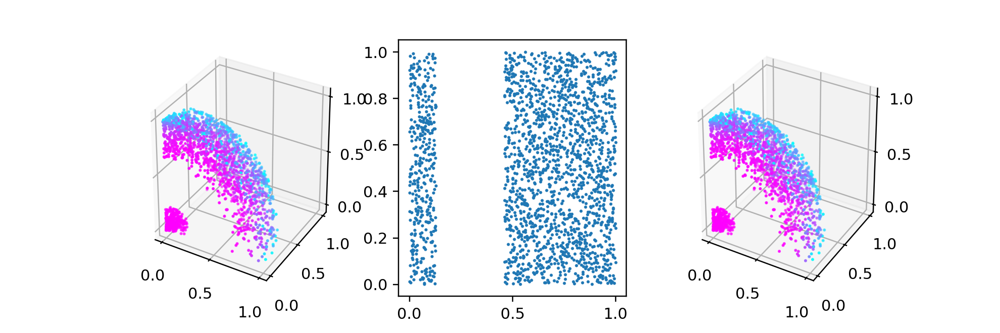

../data/c0dtlz2/8d dataf.csv datax.csv datacv.csv c0dtlz2
F.shape: (4005, 8)
X.shape: (4005, 7)
CV.shape: (4005,)
F.shape: (4005, 8)
X.shape: (4005, 7)
CV.shape: (4005,)
[[9.16060602e-04 3.43806011e-04 1.45756697e-03 8.32414559e-04
  8.69005863e-03 5.31931495e-01 8.05894054e-01 2.59816025e-01]
 [3.78685317e-03 2.83774550e-03 4.06028271e-03 1.65203677e-02
  6.32058349e-02 6.33054610e-02 7.23399245e-01 6.84382329e-01]
 [1.26252728e-02 2.20797680e-01 3.80099340e-01 3.25086983e-02
  6.21982732e-01 2.36923342e-01 5.95499049e-01 8.91199034e-02]]
[[0.83267616 0.37145059 0.0106561  0.14002947 0.71812421 0.37636817
  0.77142692]
 [0.52014389 0.07982375 0.51145706 0.17343159 0.22975624 0.54855116
  0.59059217]
 [0.94318914 0.59202138 0.80819532 0.39260996 0.95302386 0.33547454
  0.0363625 ]]
[0.51968845 0.97362223 0.19893487]


<IPython.core.display.Javascript object>


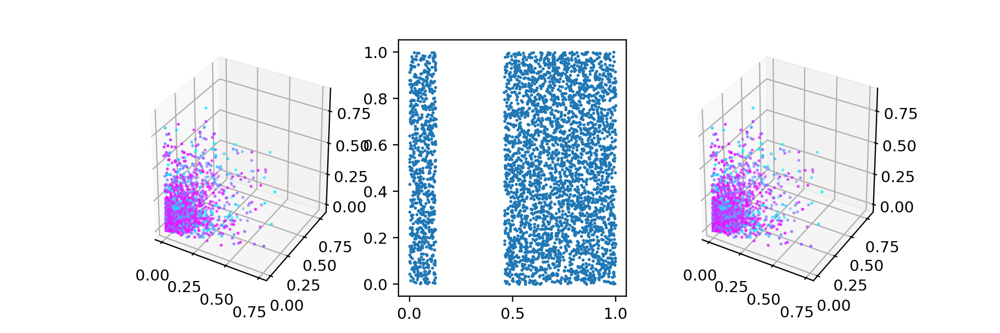

In [6]:
from vis.generators import c0dtlz2

dims = {"2d": 750, "3d": 1500, "4d": 3000, "8d": 6000}

for dim in dims:
    # Open all files
    fullpathf = "../data/c0dtlz2/{0:s}/dataf.csv".format(dim)
    path, filenamef = os.path.split(fullpathf)
    dirs = path.split('/')
    frontname = dirs[-2]
    os.makedirs(path, exist_ok = True)
    filenamex = filenamef.split('.')[0][0:-1] + 'x.csv'
    fullpathx = os.path.join(path, filenamex)
    filenamecv = filenamef.split('.')[0][0:-1] + 'cv.csv'
    fullpathcv = os.path.join(path, filenamecv)
    print(path, filenamef, filenamex, filenamecv, frontname)

    np.random.seed(123456)
    r, n, m = 1, dims[dim], int(dim[0])
    F, X, CV = c0dtlz2.surface(r = r, n = n, m = m) # non-uniform
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    print("CV.shape:", CV.shape)
    
    Ip = tr.pfindices(F)
    F = F[Ip]
    X = X[Ip]
    CV = CV[Ip]
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    print("CV.shape:", CV.shape)

    print(F[0:3,:])
    print(X[0:3,:])
    print(CV[0:3])
    
    # Just to make sure if we can get correct F from X.
    F_ = np.zeros(F.shape)
    for i in range(m):
        if i < m-1:
            F_[:,i] = np.prod(np.sin(X[:,0:i] * (np.pi / 2)), axis = 1) \
                    * np.cos(X[:,i] * (np.pi / 2))
        else:
            F_[:,i] = np.prod(np.sin(X[:,0:i-1] * (np.pi / 2)), axis = 1) \
                    * np.sin(X[:,i-1] * (np.pi / 2))
    F_ = F_[:,::-1]
    F_ = r * F_
    
    color = [cm.cool(v * 1.0) for v in CV]

    # Plot
    if dim == "2d":
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1)
        ax1.scatter(F[:,0], F[:,1], s = 1, c = color)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.plot(X[:,0], lw = 1.0)
        ax3 = fig.add_subplot(1, 3, 3)
        ax3.scatter(F_[:,0], F_[:,1], s = 1, c = color)
        plt.show()
    else:
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1, projection = '3d')
        ax1.scatter(F[:,0], F[:,1], F[:,2], s = 1, c = color)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.scatter(X[:,0], X[:,1], s = 1)
        ax3 = fig.add_subplot(1, 3, 3, projection = '3d')
        ax3.scatter(F_[:,0], F_[:,1], F_[:,2], s = 1, c = color)
        plt.show()

    np.savetxt(fullpathf, F, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathx, X, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathcv, CV, delimiter = ',', fmt = "%1.4e")

### Generate Pareto-optimal front for C2-DTLZ2 (uniformly random distributed)

../data/c2dtlz2/2d dataf.csv datax.csv datacv.csv c2dtlz2
F.shape: (503, 2)
X.shape: (503, 1)
CV.shape: (503,)
F.shape: (503, 2)
X.shape: (503, 1)
CV.shape: (503,)
[[0.06251053 0.9980443 ]
 [0.74601291 0.66593148]
 [0.99597843 0.08959332]]
[[0.03982141]
 [0.5360686 ]
 [0.94288654]]
[0.0626932  0.80276612 0.12891831]


<IPython.core.display.Javascript object>


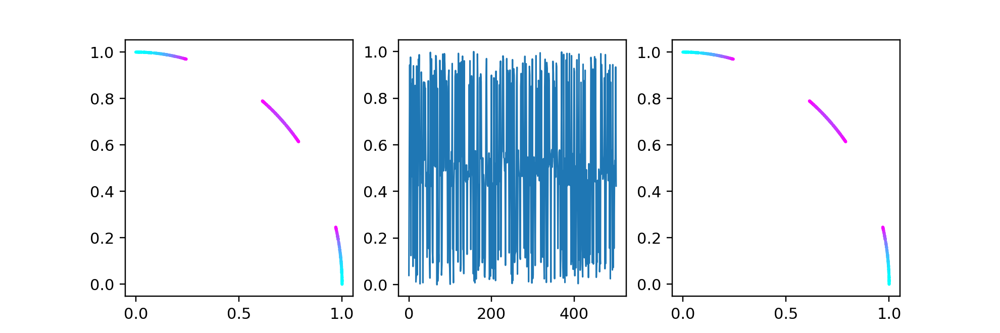

../data/c2dtlz2/3d dataf.csv datax.csv datacv.csv c2dtlz2
F.shape: (1086, 3)
X.shape: (1086, 2)
CV.shape: (1086,)
F.shape: (1086, 3)
X.shape: (1086, 2)
CV.shape: (1086,)
[[0.46152142 0.61846595 0.63600146]
 [0.06451624 0.03401722 0.9973367 ]
 [0.58778611 0.56794654 0.576146  ]]
[[0.56117444 0.40812907]
 [0.04647313 0.69109827]
 [0.60911192 0.51092729]]
[0.86543174 0.02946455 0.7502966 ]


<IPython.core.display.Javascript object>


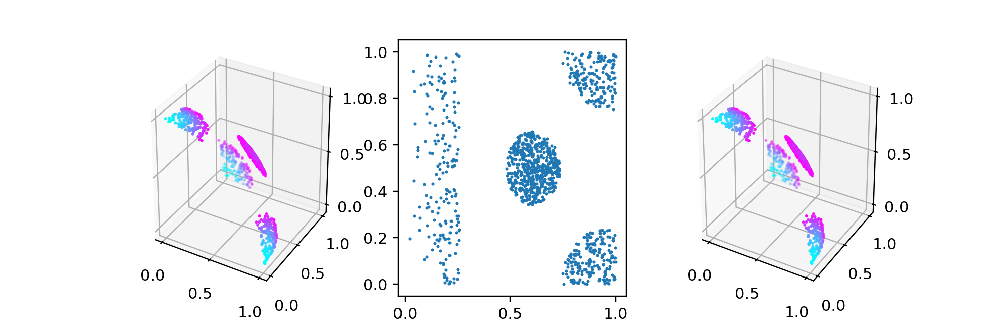

../data/c2dtlz2/4d dataf.csv datax.csv datacv.csv c2dtlz2
F.shape: (2088, 4)
X.shape: (2088, 3)
CV.shape: (2088,)
F.shape: (2088, 4)
X.shape: (2088, 3)
CV.shape: (2088,)
[[0.5813911  0.44542498 0.57194366 0.36940685]
 [0.28174193 0.16744468 0.08846562 0.94061554]
 [0.64361119 0.44978403 0.35509968 0.50730975]]
[[0.75912177 0.57792617 0.5838106 ]
 [0.22049793 0.83216165 0.65862406]
 [0.66128001 0.72961777 0.61169382]]
[0.87634474 0.47020173 0.92627011]


<IPython.core.display.Javascript object>


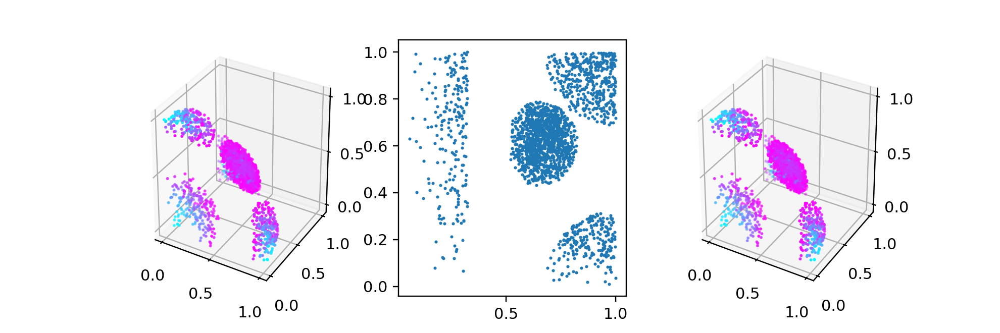

../data/c2dtlz2/5d dataf.csv datax.csv datacv.csv c2dtlz2
F.shape: (2098, 5)
X.shape: (2098, 4)
CV.shape: (2098,)
F.shape: (2098, 5)
X.shape: (2098, 4)
CV.shape: (2098,)
[[0.5291247  0.51163106 0.33415953 0.38107788 0.44875134]
 [0.56809796 0.36822184 0.39519828 0.43890913 0.439152  ]
 [0.52154783 0.51080919 0.30307878 0.38243677 0.47848427]]
[[0.70373779 0.71954535 0.72868679 0.51069968]
 [0.71055791 0.67506045 0.66361789 0.63388957]
 [0.68237273 0.71312231 0.74948505 0.50662191]]
[0.85585082 0.83775771 0.88724037]


<IPython.core.display.Javascript object>


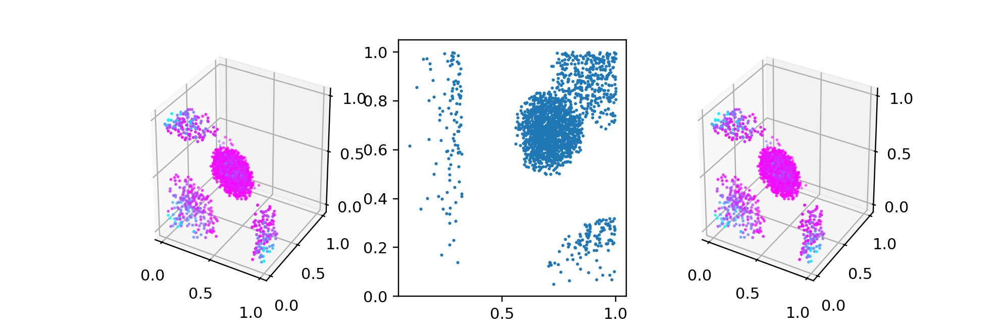

../data/c2dtlz2/8d dataf.csv datax.csv datacv.csv c2dtlz2
F.shape: (4305, 8)
X.shape: (4305, 7)
CV.shape: (4305,)
F.shape: (4305, 8)
X.shape: (4305, 7)
CV.shape: (4305,)
[[0.30180201 0.41372044 0.42023734 0.18903605 0.42866303 0.34699131
  0.33740595 0.32774861]
 [0.24614513 0.40882374 0.39186728 0.20789197 0.44297886 0.43251981
  0.34979739 0.26426278]
 [0.33083585 0.43518264 0.40380801 0.44363212 0.34563407 0.25992103
  0.33215727 0.20962597]]
[[0.7874202  0.76750916 0.74273012 0.64564842 0.82303971 0.56252554
  0.40122348]
 [0.82974276 0.76371623 0.68038077 0.61987083 0.79325345 0.56231227
  0.34501511]
 [0.86555073 0.77934557 0.81758297 0.74369567 0.63183666 0.59497042
  0.41381035]]
[0.90270628 0.98386654 0.92101035]


<IPython.core.display.Javascript object>


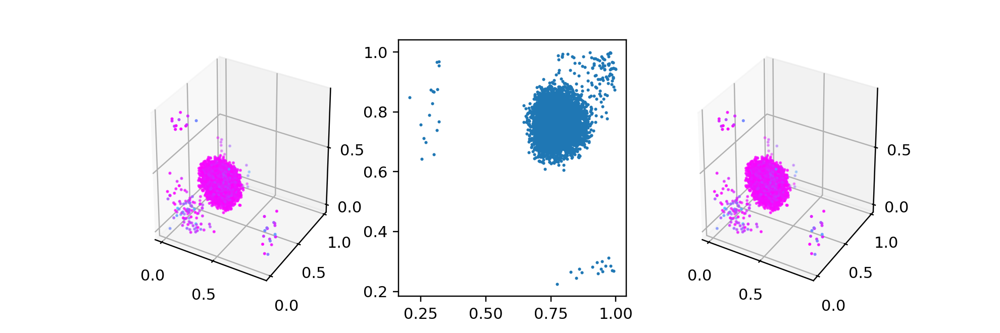

In [7]:
from vis.generators import c2dtlz2

dims = {"2d": 1100, "3d": 3750, "4d": 9750, "5d": 20000, "8d": 230000}

for dim in dims:
    # Open all files
    fullpathf = "../data/c2dtlz2/{0:s}/dataf.csv".format(dim)
    path, filenamef = os.path.split(fullpathf)
    dirs = path.split('/')
    frontname = dirs[-2]
    os.makedirs(path, exist_ok = True)
    filenamex = filenamef.split('.')[0][0:-1] + 'x.csv'
    fullpathx = os.path.join(path, filenamex)
    filenamecv = filenamef.split('.')[0][0:-1] + 'cv.csv'
    fullpathcv = os.path.join(path, filenamecv)
    print(path, filenamef, filenamex, filenamecv, frontname)

    np.random.seed(123456)
    r, n, m = 1, dims[dim], int(dim[0])
    F, X, CV = c2dtlz2.surface(r = r, n = n, m = m, mode = 'lhcl2') # uniform
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    print("CV.shape:", CV.shape)
    
    Ip = tr.pfindices(F)
    F = F[Ip]
    X = X[Ip]
    CV = CV[Ip]
    print("F.shape:", F.shape)
    print("X.shape:", X.shape)
    print("CV.shape:", CV.shape)

    print(F[0:3,:])
    print(X[0:3,:])
    print(CV[0:3])
    
    # Just to make sure if we can get correct F from X.
    F_ = np.zeros(F.shape)
    for i in range(m):
        if i < m-1:
            F_[:,i] = np.prod(np.sin(X[:,0:i] * (np.pi / 2)), axis = 1) \
                    * np.cos(X[:,i] * (np.pi / 2))
        else:
            F_[:,i] = np.prod(np.sin(X[:,0:i-1] * (np.pi / 2)), axis = 1) \
                    * np.sin(X[:,i-1] * (np.pi / 2))
    F_ = F_[:,::-1]
    F_ = r * F_
    
    color = [cm.cool(v * 1.0) for v in CV]

    # Plot
    if dim == "2d":
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1)
        ax1.scatter(F[:,0], F[:,1], s = 1, c = color)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.plot(X[:,0], lw = 1.0)
        ax3 = fig.add_subplot(1, 3, 3)
        ax3.scatter(F_[:,0], F_[:,1], s = 1, c = color)
        plt.show()
    else:
        fig = plt.figure(figsize = (9, 3))
        ax1 = fig.add_subplot(1, 3, 1, projection = '3d')
        ax1.scatter(F[:,0], F[:,1], F[:,2], s = 1, c = color)
        ax2 = fig.add_subplot(1, 3, 2)
        ax2.scatter(X[:,0], X[:,1], s = 1)
        ax3 = fig.add_subplot(1, 3, 3, projection = '3d')
        ax3.scatter(F_[:,0], F_[:,1], F_[:,2], s = 1, c = color)
        plt.show()

    np.savetxt(fullpathf, F, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathx, X, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathcv, CV, delimiter = ',', fmt = "%1.4e")

### Generate Pareto-optimal front for DTLZ8 (uniformly random distributed)

../data/dtlz8/2d dataf.csv datacv.csv dtlz8
F.shape (547, 2)
CV.shape (547,)
F.shape: (547, 2)
CV.shape: (547,)
[[0.         1.        ]
 [0.00666667 0.98666667]
 [0.01333333 0.97333333]]
[1. 1. 1.]


<IPython.core.display.Javascript object>


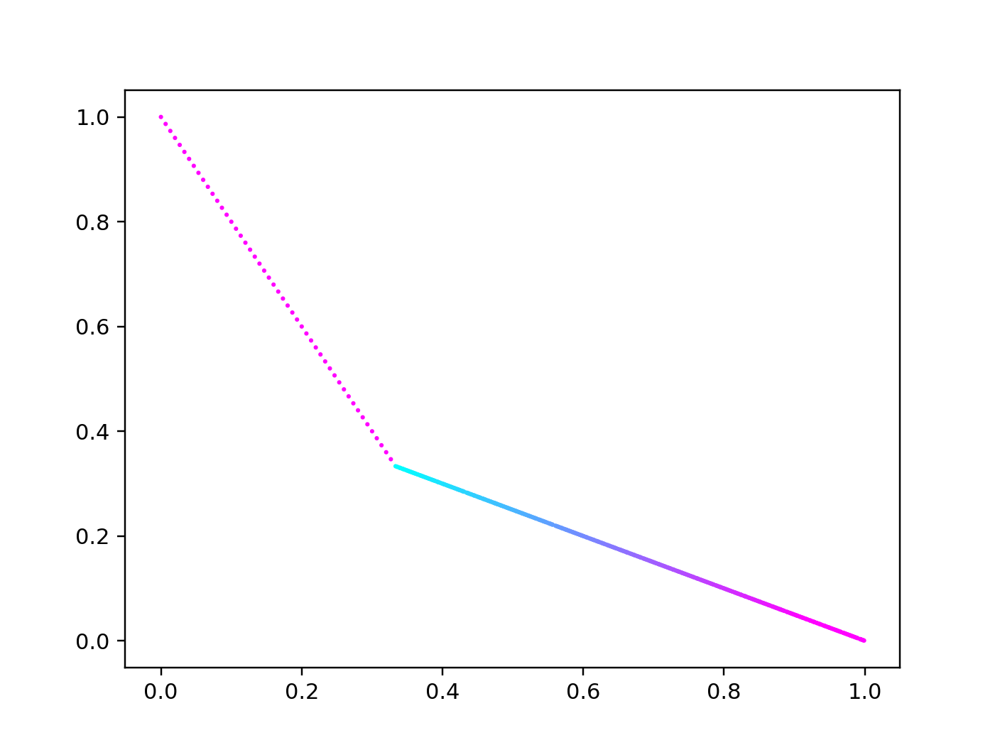

../data/dtlz8/3d dataf.csv datacv.csv dtlz8
F.shape (1038, 3)
CV.shape (1038,)
F.shape: (1038, 3)
CV.shape: (1038,)
[[0.     0.     1.    ]
 [0.0025 0.0025 0.9925]
 [0.005  0.005  0.985 ]]
[1. 1. 1.]


<IPython.core.display.Javascript object>


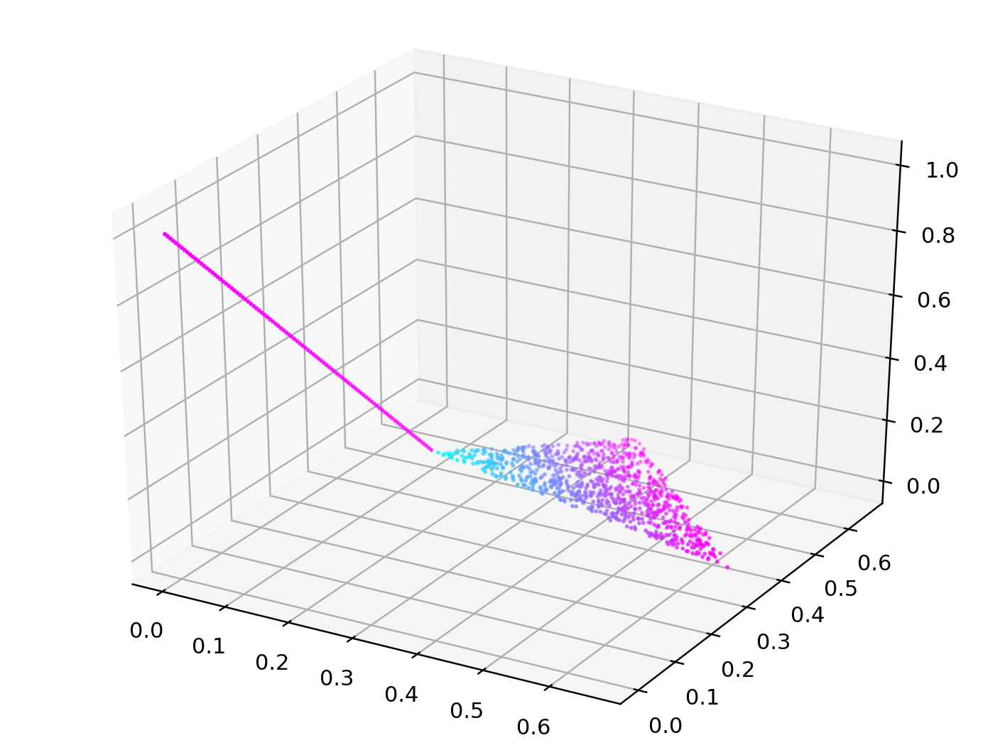

../data/dtlz8/4d dataf.csv datacv.csv dtlz8
F.shape (2172, 4)
CV.shape (2172,)
F.shape: (2105, 4)
CV.shape: (2105,)
[[0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+00]
 [6.25000e-04 6.25000e-04 6.25000e-04 9.98125e-01]
 [1.25000e-03 1.25000e-03 1.25000e-03 9.96250e-01]]
[1. 1. 1.]


<IPython.core.display.Javascript object>


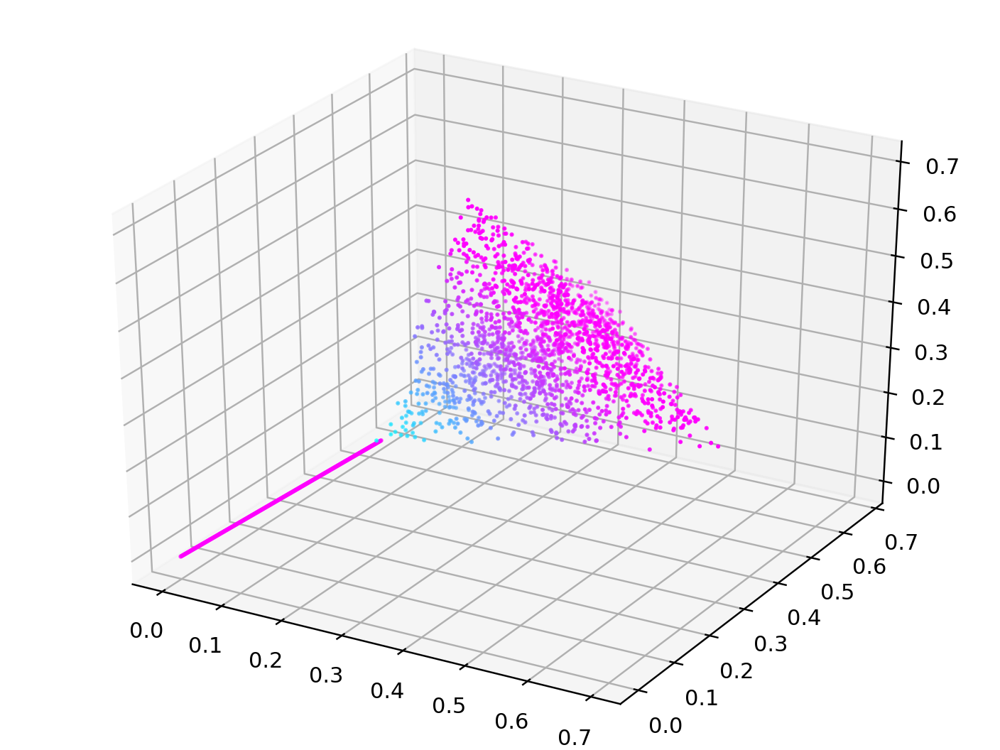

../data/dtlz8/6d dataf.csv datacv.csv dtlz8
F.shape (2690, 6)
CV.shape (2690,)
F.shape: (2659, 6)
CV.shape: (2659,)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 1.00000000e+00]
 [4.76190476e-04 4.76190476e-04 4.76190476e-04 4.76190476e-04
  4.76190476e-04 9.98809524e-01]
 [9.52380952e-04 9.52380952e-04 9.52380952e-04 9.52380952e-04
  9.52380952e-04 9.97619048e-01]]
[1. 1. 1.]


<IPython.core.display.Javascript object>


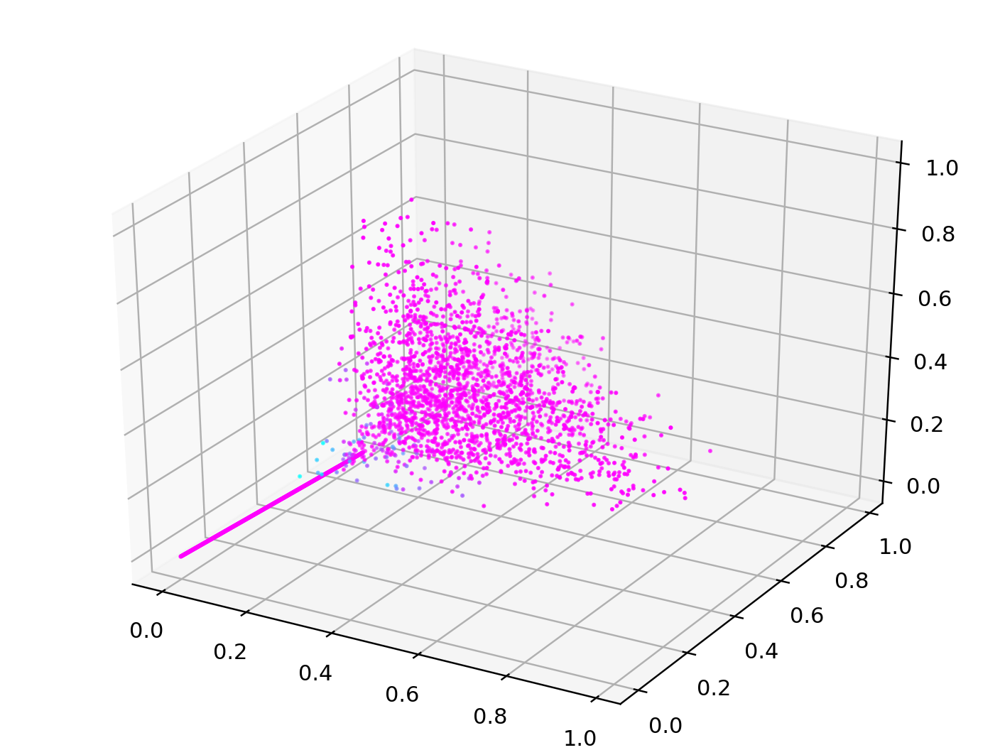

../data/dtlz8/8d dataf.csv datacv.csv dtlz8
F.shape (3680, 8)
CV.shape (3680,)
F.shape: (3680, 8)
CV.shape: (3680,)
[[0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 1.00000000e+00]
 [3.57142857e-04 3.57142857e-04 3.57142857e-04 3.57142857e-04
  3.57142857e-04 3.57142857e-04 3.57142857e-04 9.99107143e-01]
 [7.14285714e-04 7.14285714e-04 7.14285714e-04 7.14285714e-04
  7.14285714e-04 7.14285714e-04 7.14285714e-04 9.98214286e-01]]
[1. 1. 1.]


<IPython.core.display.Javascript object>


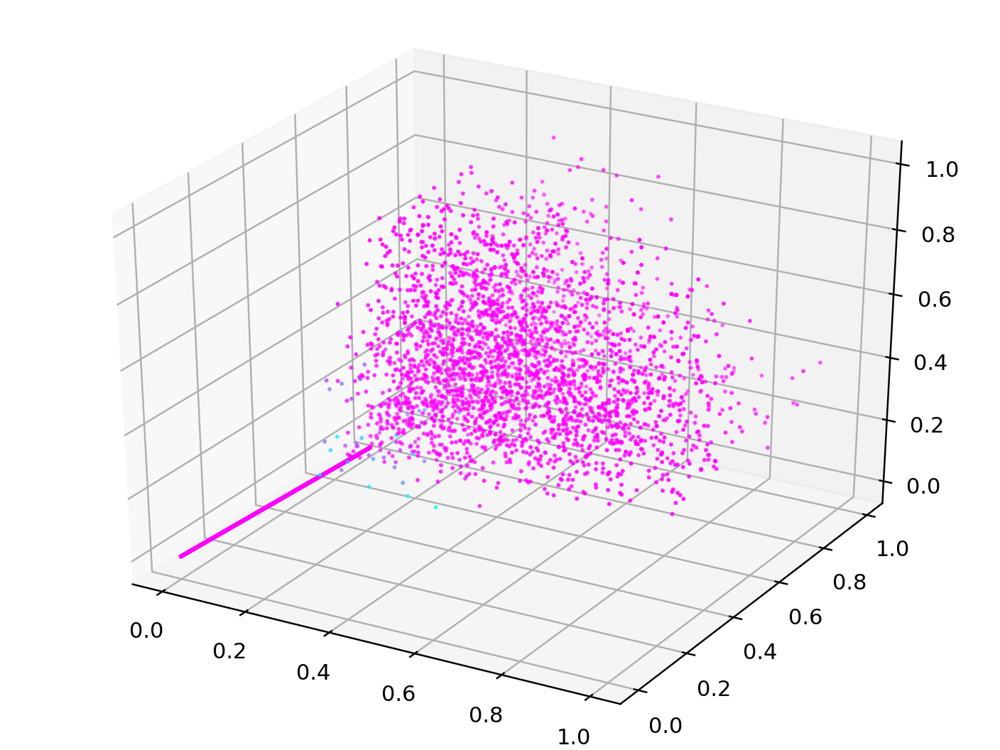

In [8]:
from vis.generators import dtlz8

# These factors need to be multiplied so that constraint violations
# are better visible when plotted with color.
cc = {2: 2.0, 3: 6.0, 4: 8.0, 6: 14.0, 8: 16.0}

dims = {'2d': [2, 50, 750], '3d': [3, 100, 11000], '4d': [4, 400, 80000], \
        '6d': [6, 600, 160000], '8d': [8, 800, 160000]}

for dim in dims:
    # Open all files
    fullpathf = "../data/dtlz8/{0:s}/dataf.csv".format(dim)
    path, filenamef = os.path.split(fullpathf)
    dirs = path.split('/')
    frontname = dirs[-2]
    os.makedirs(path, exist_ok = True)
    filenamecv = filenamef.split('.')[0][0:-1] + 'cv.csv'
    fullpathcv = os.path.join(path, filenamecv)
    print(path, filenamef, filenamecv, frontname)

    np.random.seed(123456)
    m, nl, ns = dims[dim][0], dims[dim][1], dims[dim][2]
    F, _, _, CV = dtlz8.surface(m = m, nl = nl, ns = ns, mode = 'lhcl2')
    print("F.shape", F.shape)
    print("CV.shape", CV.shape)
    
    Ip = tr.pfindices(F)
    F = F[Ip]
    CV = CV[Ip]
    print("F.shape:", F.shape)
    print("CV.shape:", CV.shape)

    print(F[0:3,:])
    print(CV[0:3])
    
    color = [cm.cool(v * cc[m]) for v in CV]

    # Plot
    if dim == "2d":
        fig = plt.figure()
        ax = fig.gca()
        ax.scatter(F[:,0], F[:,1], s = 1, c = color)
        plt.show()
    else:
        fig = plt.figure()
        ax = Axes3D(fig)
        ax.scatter(F[:,0], F[:,1], F[:,2], s = 1, c = color)
        plt.show()

    np.savetxt(fullpathf, F, delimiter = ',', fmt = "%1.4e")
    np.savetxt(fullpathcv, CV, delimiter = ',', fmt = "%1.4e")